# Определение количества людей на фотографии

### Подход на основе плотностных карт (Density Map Estimation)

В этом ноутбуке мы решаем задачу **подсчёта людей на фотографии** с помощью нейросетевого подхода, основанного на предсказании **карты плотности** (density map).

**Идея:** вместо того, чтобы напрямую предсказывать число (регрессия), модель учится строить heatmap, где в каждой точке изображения указана «плотность» наличия человека. Сумма всех значений по карте плотности даёт общее количество людей на фото.

**Что улучшено:**
- **Комбинированная функция потерь** — MSE на пикселях карты плотности + MSE на общем количестве людей (модель «видит» ошибку в счёте напрямую)
- **Стабильное обучение** — ReduceLROnPlateau, EarlyStopping, gradient clipping, больше эпох
- **SCALE_FACTOR** — задаётся один раз как глобальная константа

**Датасет:** [ShanghaiTech](https://www.kaggle.com/datasets/tthien/shanghaitech-with-people-density-map)

## 1. Загрузка данных

Скачиваем датасет ShanghaiTech с Kaggle. Датасет уже содержит готовые карты плотности в формате `.h5`.

In [47]:
import os

os.environ['KAGGLE_API_TOKEN'] = 'KGAT_d772a2e8988b54317e7f763dbf19db74'

!kaggle datasets download -d tthien/shanghaitech-with-people-density-map
!unzip -q shanghaitech-with-people-density-map.zip -d dataset

print("Готово! Данные лежат в /content/dataset")

Dataset URL: https://www.kaggle.com/datasets/tthien/shanghaitech-with-people-density-map
License(s): unknown
shanghaitech-with-people-density-map.zip: Skipping, found more recently modified local copy (use --force to force download)
replace dataset/ShanghaiTech/part_A/test_data/ground-truth-h5/IMG_1.h5? [y]es, [n]o, [A]ll, [N]one, [r]ename: Готово! Данные лежат в /content/dataset


## 2. Гиперпараметры и функции загрузки данных

**`SCALE_FACTOR`** задаётся **один раз** здесь и используется везде — при подготовке данных, в функции потерь и при инференсе.

Каждый пример в датасете состоит из:
- **Изображения** (`.jpg`) — фотография с людьми
- **Карты плотности** (`.h5`) — матрица, где сумма значений = кол-во людей

In [48]:
import numpy as np
import os
import cv2
import h5py
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers

# ============================================================
# ГИПЕРПАРАМЕТРЫ (задаются один раз)
# ============================================================
SCALE_FACTOR  = 1000          # масштабирование плотности для стабильного MSE
TARGET_SIZE   = (256, 256)    # размер входа модели
BATCH_SIZE    = 8
ALPHA         = 0.01         # вес count-loss в комбинированной функции потерь
LEARNING_RATE = 1e-4
EPOCHS        = 100            # больше эпох + early stopping

print(f"SCALE_FACTOR = {SCALE_FACTOR}")
print(f"TARGET_SIZE  = {TARGET_SIZE}")
print(f"BATCH_SIZE   = {BATCH_SIZE}")
print(f"ALPHA (count-loss weight) = {ALPHA}")
print(f"LEARNING_RATE = {LEARNING_RATE}")
print(f"EPOCHS       = {EPOCHS}")

SCALE_FACTOR = 1000
TARGET_SIZE  = (256, 256)
BATCH_SIZE   = 8
ALPHA (count-loss weight) = 0.01
LEARNING_RATE = 0.0001
EPOCHS       = 100


In [49]:
# ============================================================
# Функция загрузки пары (изображение, карта плотности)
# ============================================================
def load_data(img_path, h5_path, target_size=TARGET_SIZE, scale_factor=SCALE_FACTOR):
    # Загрузка фото
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    orig_h, orig_w = img.shape[:2]
    img = cv2.resize(img, target_size) / 255.0

    # Загрузка карты плотности (.h5)
    with h5py.File(h5_path, 'r') as hf:
        density = np.asarray(hf['density'])

    # Ресайз + масштабирование: сумма карты = gt_count * SCALE_FACTOR
    area_ratio = (orig_h * orig_w) / (target_size[0] * target_size[1])
    density = cv2.resize(density, target_size)
    density = density * area_ratio * scale_factor

    return img, density


# ============================================================
# Генератор данных (бесконечный, для model.fit)
# ============================================================
def data_generator(img_folder, h5_folder, batch_size=BATCH_SIZE):
    img_files = sorted(os.listdir(img_folder))
    while True:
        indices = np.random.permutation(len(img_files))
        for i in range(0, len(img_files), batch_size):
            batch_imgs, batch_densities = [], []
            for j in indices[i:i+batch_size]:
                f = img_files[j]
                name = f.replace('.jpg', '')
                img, den = load_data(f"{img_folder}/{f}", f"{h5_folder}/{name}.h5")
                batch_imgs.append(img)
                batch_densities.append(np.expand_dims(den, axis=-1))
            if len(batch_imgs) > 0:
                yield np.array(batch_imgs), np.array(batch_densities)

---
## Что такое карта плотности (Density Map)?

Представьте невидимую сетку над фотографией. В каждой ячейке — число, показывающее «насколько вероятно», что тут человек. Сумма по всей сетке = количество людей.

- **Яркие пятна** — места с людьми
- **Тёмные области** — пустые места
- **Интенсивность** зависит от «размера» человека (ближе к камере = пятно больше)

## 3. Визуализация: реальная фотография и её карта плотности (ground truth)

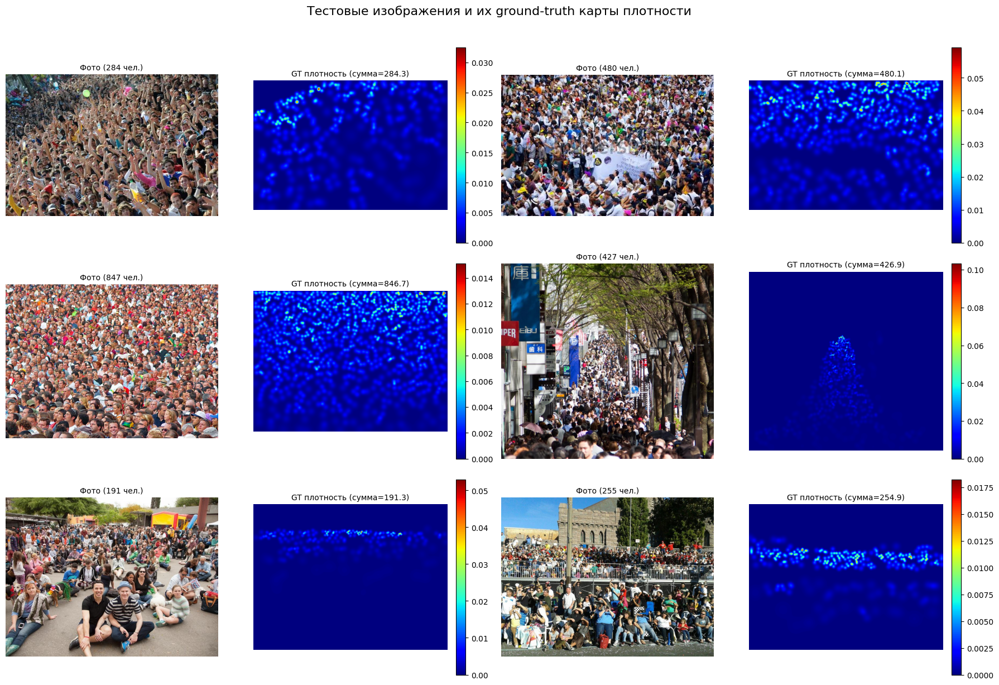

In [50]:
import matplotlib.pyplot as plt

BASE_PATH   = '/content/dataset/ShanghaiTech/part_A'
test_imgs_dir = os.path.join(BASE_PATH, 'test_data/images')
test_h5_dir   = os.path.join(BASE_PATH, 'test_data/ground-truth-h5')

test_files = sorted(os.listdir(test_imgs_dir))
np.random.seed(42)
sample_indices = np.random.choice(len(test_files), size=min(6, len(test_files)), replace=False)

fig, axes = plt.subplots(3, 4, figsize=(18, 12))
fig.suptitle('Тестовые изображения и их ground-truth карты плотности', fontsize=16, y=1.02)

for idx, si in enumerate(sample_indices):
    fname = test_files[si]
    name  = fname.replace('.jpg', '')

    orig_img = cv2.imread(os.path.join(test_imgs_dir, fname))
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

    with h5py.File(os.path.join(test_h5_dir, name + '.h5'), 'r') as hf:
        gt_density = np.asarray(hf['density'])
    true_count = np.sum(gt_density)

    row = idx // 2; col = (idx % 2) * 2

    axes[row, col].imshow(orig_img)
    axes[row, col].set_title(f'Фото ({true_count:.0f} чел.)', fontsize=10)
    axes[row, col].axis('off')

    im = axes[row, col+1].imshow(gt_density, cmap='jet', interpolation='bilinear')
    axes[row, col+1].set_title(f'GT плотность (сумма={true_count:.1f})', fontsize=10)
    axes[row, col+1].axis('off')
    plt.colorbar(im, ax=axes[row, col+1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

## 4. Наложение карты плотности на реальную фотографию

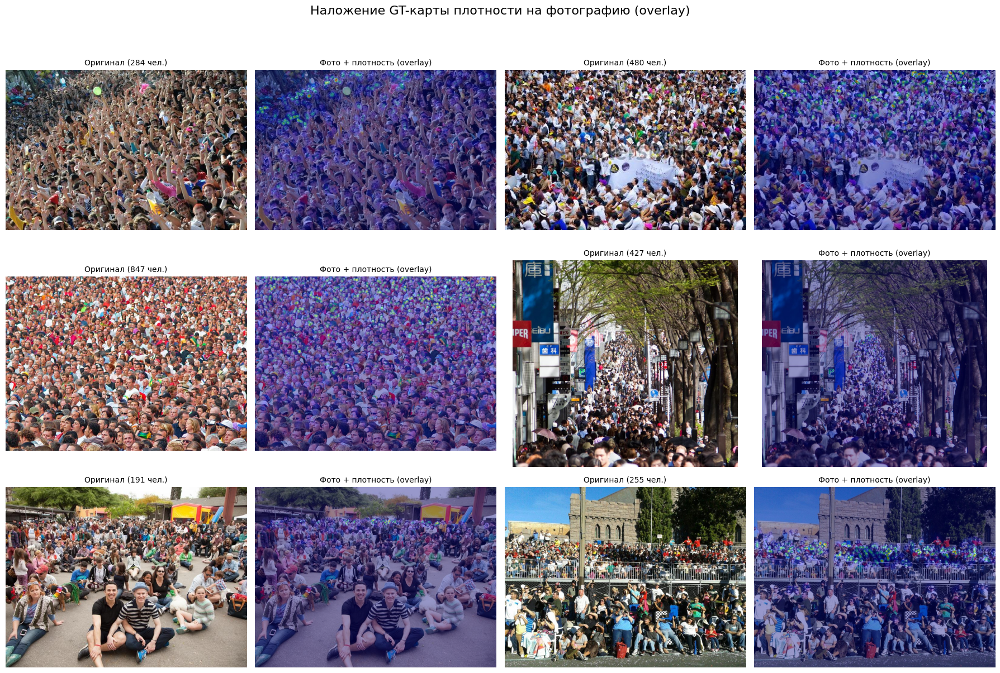

In [51]:
fig, axes = plt.subplots(3, 4, figsize=(18, 12))
fig.suptitle('Наложение GT-карты плотности на фотографию (overlay)', fontsize=16, y=1.02)

for idx, si in enumerate(sample_indices):
    fname = test_files[si]
    name  = fname.replace('.jpg', '')

    orig_img = cv2.imread(os.path.join(test_imgs_dir, fname))
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

    with h5py.File(os.path.join(test_h5_dir, name + '.h5'), 'r') as hf:
        gt_density = np.asarray(hf['density'])
    true_count = np.sum(gt_density)

    row = idx // 2; col = (idx % 2) * 2

    gt_vis     = gt_density / (gt_density.max() + 1e-8)
    gt_resized = cv2.resize(gt_vis, (orig_img.shape[1], orig_img.shape[0]))
    heatmap    = plt.cm.jet(gt_resized)[:, :, :3]
    heatmap    = (heatmap * 255).astype(np.uint8)
    overlay    = cv2.addWeighted(orig_img, 0.6, heatmap, 0.4, 0)

    axes[row, col].imshow(orig_img)
    axes[row, col].set_title(f'Оригинал ({true_count:.0f} чел.)', fontsize=10)
    axes[row, col].axis('off')

    axes[row, col+1].imshow(overlay)
    axes[row, col+1].set_title('Фото + плотность (overlay)', fontsize=10)
    axes[row, col+1].axis('off')

plt.tight_layout()
plt.show()

## 5. Архитектура модели (CSRNet-like)

CNN-энкодер-декодер:
- **Энкодер (VGG16):** извлекает признаки
- **Dilated convolutions:** увеличивают рецептивное поле без потери разрешения
- **Декодер (Conv2DTranspose):** восстанавливает до 256×256
- **Выход:** 1 канал, ReLU (плотность ≥ 0)

In [52]:
from tensorflow.keras.applications import VGG16

def build_crowd_model(input_shape=(256, 256, 3)):
    inputs = layers.Input(shape=input_shape)

    vgg = VGG16(weights='imagenet', include_top=False, input_tensor=inputs)
    x = vgg.get_layer('block3_pool').output  # (None, 32, 32, 256)

    # Dilated backend — сохраняем 32×32
    x = layers.Conv2D(512, 3, padding='same', dilation_rate=2, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(512, 3, padding='same', dilation_rate=2, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(512, 3, padding='same', dilation_rate=2, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, 3, padding='same', dilation_rate=2, activation='relu')(x)
    x = layers.BatchNormalization()(x)

    # Decoder: 32→64→128→256
    x = layers.Conv2DTranspose(128, 4, strides=2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(64,  4, strides=2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(32,  4, strides=2, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)

    outputs = layers.Conv2D(1, 1, activation='relu', padding='same')(x)

    model = models.Model(inputs=inputs, outputs=outputs)

    # Замораживаем VGG
    for layer in vgg.layers:
        layer.trainable = False

    return model

model = build_crowd_model()
model.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_68 (Conv2D)              │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_72          │ (None, 32, 32, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_69 (Conv2D)              │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_73          │ (None, 32, 32, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_70 (Conv2D)              │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_74          │ (None, 32, 32, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_71 (Conv2D)              │ (None, 32, 32, 256)    │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_75          │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_22             │ (None, 64, 64, 128)    │       524,416 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_76          │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_23             │ (None, 128, 128, 64)   │       131,13

 Total params: 9,511,617 (36.28 MB)

 Trainable params: 7,772,097 (29.65 MB)

 Non-trainable params: 1,739,520 (6.64 MB)

## 6. Комбинированная функция потерь

### Проблема чистого MSE
Обычный MSE штрафует за отклонение **каждого пикселя** карты плотности. Но модель может «угадывать» форму плотности и при этом систематически занижать/завышать общее число людей — ведь MSE на пикселях это не чувствует напрямую.

### Решение: комбинированный loss

$$L = \text{MSE}(\hat{D}, D) + \alpha \cdot \text{MSE}(\text{count}(\hat{D}),\; \text{count}(D))$$

- **Первое слагаемое** — стандартный MSE на пикселях карты плотности
- **Второе слагаемое** — штраф за ошибку в **общем количестве людей** (сумма по всей карте)
- **$\alpha$** — вес count-loss (по умолчанию 0.01)

Количество людей вычисляется как:
$$\text{count} = \frac{\sum \text{density}}{\text{SCALE\_FACTOR}}$$

In [53]:
import tensorflow.keras.backend as K

# ALPHA уже задана как глобальный гиперпараметр
ALPHA = 0.01  # если нужно изменить — поменяйте здесь

def combined_loss(y_true, y_pred):
    # ---- 1) MSE на пикселях карты плотности ----
    mse_map = K.mean(K.square(y_true - y_pred))

    # ---- 2) MSE на количестве людей ----
    # Суммируем по пространственным измерениям (H, W), получаем вектор (batch_size,)
    pred_counts = K.sum(y_pred, axis=[1, 2, 3]) / SCALE_FACTOR
    true_counts = K.sum(y_true, axis=[1, 2, 3]) / SCALE_FACTOR
    mse_count   = K.mean(K.square(true_counts - pred_counts))

    # ---- Комбинация ----
    return mse_map + ALPHA * mse_count


# Дополнительно: метрика MAE на количестве людей (удобно мониторить)
def count_mae(y_true, y_pred):
    pred_counts = K.sum(y_pred, axis=[1, 2, 3]) / SCALE_FACTOR
    true_counts = K.sum(y_true, axis=[1, 2, 3]) / SCALE_FACTOR
    return K.mean(K.abs(true_counts - pred_counts))

print(f"combined_loss: MSE_map + {ALPHA} * MSE_count")
print(f"count_mae: отслеживает среднюю ошибку в числе людей")

combined_loss: MSE_map + 0.01 * MSE_count
count_mae: отслеживает среднюю ошибку в числе людей


## 7. Компиляция и обучение модели

### Улучшения стабильности:
| Механизм | Что делает |
|---|---|
| **ReduceLROnPlateau** | Уменьшает LR, если val_loss не улучшается 5 эпох |
| **EarlyStopping** | Останавливает обучение при отсутствии улучшений 10 эпох |
| **ModelCheckpoint** | Сохраняет лучшую модель по val_loss |
| **Gradient clipping** | Ограничивает градиенты (max_norm=1.0) — защита от взрывов |
| **BatchNormalization** | В архитектуре — стабильность активаций

In [54]:
import tensorflow as tf
import os

# --- GPU ---
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    print('GPU не найден! Включите в Runtime -> Change runtime type.')
else:
    print(f'GPU: {device_name}')

# --- Пути ---
BASE_PATH  = '/content/dataset/ShanghaiTech/part_A'
train_imgs = os.path.join(BASE_PATH, 'train_data/images')
train_h5   = os.path.join(BASE_PATH, 'train_data/ground-truth-h5')
val_imgs   = os.path.join(BASE_PATH, 'test_data/images')
val_h5     = os.path.join(BASE_PATH, 'test_data/ground-truth-h5')

# --- Компиляция ---
optimizer = optimizers.Adam(learning_rate=LEARNING_RATE, clipnorm=1.0)  # gradient clipping

model.compile(
    optimizer=optimizer,
    loss=combined_loss,
    metrics=[count_mae, 'mae']
)

# --- Callbacks для стабильного обучения ---
callbacks = [
    # Уменьшаем LR, если val_loss не улучшается 5 эпох
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=5,
        min_lr=1e-7, verbose=1
    ),
    # Ранняя остановка (10 эпох без улучшения)
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=10,
        restore_best_weights=True, verbose=1
    ),
    # Сохраняем лучшую модель
    tf.keras.callbacks.ModelCheckpoint(
        'best_crowd_model.keras',
        monitor='val_loss', save_best_only=True, verbose=1
    ),
    # Стоп при NaN
    tf.keras.callbacks.TerminateOnNaN()
]

# --- Обучение ---
with tf.device('/device:GPU:0'):
    train_gen = data_generator(train_imgs, train_h5, batch_size=BATCH_SIZE)
    val_gen   = data_generator(val_imgs,   val_h5,   batch_size=BATCH_SIZE)

    print(f"\nНачинаем обучение: {EPOCHS} эпох, batch={BATCH_SIZE}, LR={LEARNING_RATE}")
    print(f"Loss = MSE_map + {ALPHA} * MSE_count\n")

    history = model.fit(
        train_gen,
        steps_per_epoch=50,
        epochs=EPOCHS,
        validation_data=val_gen,
        validation_steps=15,
        callbacks=callbacks,
        verbose=1
    )

print("\nОбучение завершено!")

GPU: /device:GPU:0

Начинаем обучение: 100 эпох, batch=8, LR=0.0001
Loss = MSE_map + 0.01 * MSE_count

Epoch 1/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - count_mae: 456.3202 - loss: 5025.6224 - mae: 7.6544
Epoch 1: val_loss improved from None to 3756.72314, saving model to best_crowd_model.keras

Epoch 1: finished saving model to best_crowd_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 35s 410ms/step - count_mae: 415.2550 - loss: 4446.5176 - mae: 7.4881 - val_count_mae: 448.5924 - val_loss: 3756.7231 - val_mae: 6.8552 - learning_rate: 1.0000e-04
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - count_mae: 397.9064 - loss: 4364.1484 - mae: 8.1805
Epoch 2: val_loss improved from 3756.72314 to 2805.46948, saving model to best_crowd_model.keras

Epoch 2: finished saving model to best_crowd_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - count_mae: 399.0924 - loss: 4349.9438 - mae: 8.2071 - val_count_mae: 372.7018 - val_loss: 2805.4695 - val_mae: 6.1344 - learning_rate: 1.0000e-04

## 8. Графики обучения

Смотрим на:
- **Loss** — комбинированный (MSE_map + α·MSE_count)
- **count_mae** — средняя ошибка в числе людей (главная метрика!)
- **LR** — как снижался learning rate

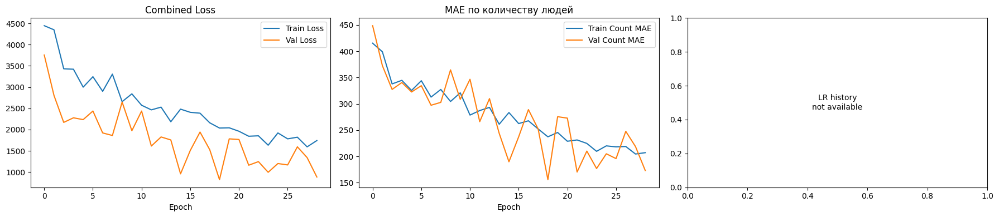

Финальный val_loss    : 884.4978
Финальный val_count_mae: 173.32 человек


In [55]:
fig, axes = plt.subplots(1, 3, figsize=(18, 4))

# Loss
axes[0].plot(history.history['loss'], label='Train Loss')
axes[0].plot(history.history['val_loss'], label='Val Loss')
axes[0].set_title('Combined Loss')
axes[0].set_xlabel('Epoch')
axes[0].legend(loc='best')

# count_mae
axes[1].plot(history.history['count_mae'], label='Train Count MAE')
axes[1].plot(history.history['val_count_mae'], label='Val Count MAE')
axes[1].set_title('MAE по количеству людей')
axes[1].set_xlabel('Epoch')
axes[1].legend(loc='best')

# Learning rate
lr_history = history.history.get('lr', [])
if lr_history:
    axes[2].plot(lr_history, color='green')
    axes[2].set_title('Learning Rate')
    axes[2].set_xlabel('Epoch')
    axes[2].set_yscale('log')
else:
    axes[2].text(0.5, 0.5, 'LR history\nnot available', ha='center', va='center', transform=axes[2].transAxes)

plt.tight_layout()
plt.show()

# Финальные метрики
print(f"Финальный val_loss    : {history.history['val_loss'][-1]:.4f}")
print(f"Финальный val_count_mae: {history.history['val_count_mae'][-1]:.2f} человек")

## 9. Инференс: предсказанная карта плотности на тестовых изображениях

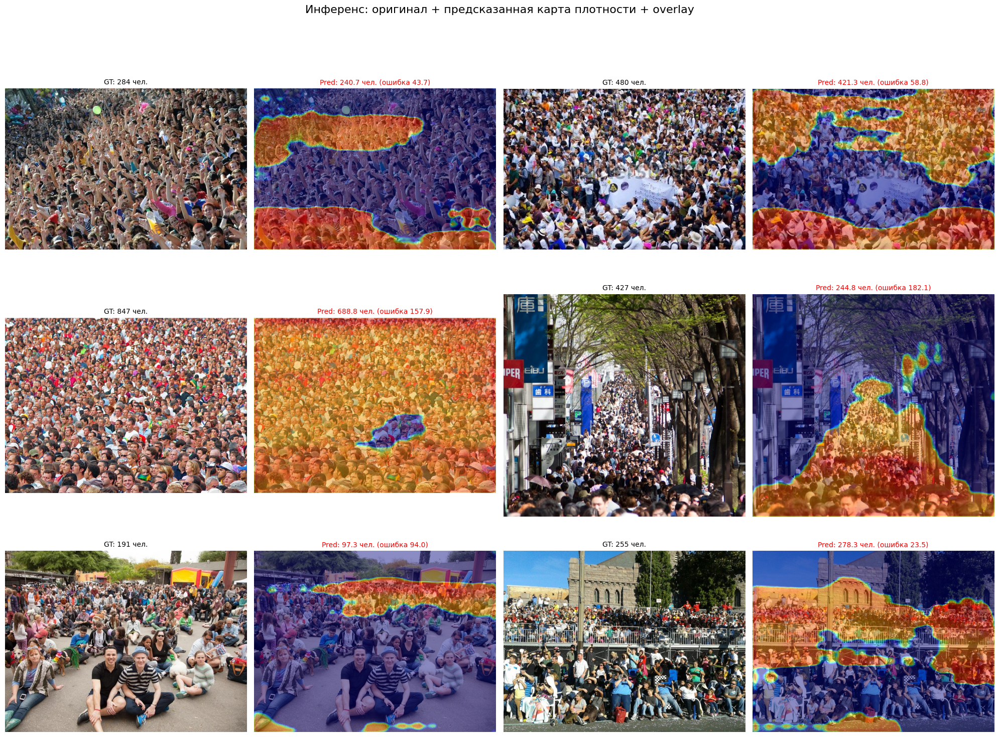


Средняя ошибка (MAE): 93.33 человек
Средняя относительная ошибка (MAPE): 24.5%


In [56]:
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle('Инференс: оригинал + предсказанная карта плотности + overlay', fontsize=16, y=1.02)

mae_errors = []
mape_list  = []

for idx, si in enumerate(sample_indices):
    fname = test_files[si]
    name  = fname.replace('.jpg', '')

    orig_img = cv2.imread(os.path.join(test_imgs_dir, fname))
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

    with h5py.File(os.path.join(test_h5_dir, name + '.h5'), 'r') as hf:
        gt_density = np.asarray(hf['density'])
    gt_count = np.sum(gt_density)

    img_input = cv2.resize(orig_img, TARGET_SIZE) / 255.0
    img_batch = np.expand_dims(img_input, axis=0)

    pred_density = model.predict(img_batch, verbose=0)[0, :, :, 0]
    pred_count   = np.sum(pred_density) / SCALE_FACTOR  # используем единственный SCALE_FACTOR

    mae_errors.append(abs(pred_count - gt_count))
    if gt_count > 0:
        mape_list.append(abs(pred_count - gt_count) / gt_count * 100)

    row = idx // 2; col = (idx % 2) * 2

    pred_vis     = pred_density / (pred_density.max() + 1e-8)
    pred_resized = cv2.resize(pred_vis, (orig_img.shape[1], orig_img.shape[0]))
    heatmap      = plt.cm.jet(pred_resized)[:, :, :3]
    heatmap      = (heatmap * 255).astype(np.uint8)
    overlay      = cv2.addWeighted(orig_img, 0.55, heatmap, 0.45, 0)

    axes[row, col].imshow(orig_img)
    axes[row, col].set_title(f'GT: {gt_count:.0f} чел.', fontsize=10)
    axes[row, col].axis('off')

    color = 'green' if abs(pred_count - gt_count) < 20 else 'red'
    axes[row, col+1].imshow(overlay)
    axes[row, col+1].set_title(
        f'Pred: {pred_count:.1f} чел. (ошибка {abs(pred_count-gt_count):.1f})',
        fontsize=10, color=color
    )
    axes[row, col+1].axis('off')

plt.tight_layout()
plt.show()

print(f'\nСредняя ошибка (MAE): {np.mean(mae_errors):.2f} человек')
print(f'Средняя относительная ошибка (MAPE): {np.mean(mape_list):.1f}%')

## 10. Сравнение: Ground Truth vs Предсказанная карта плотности

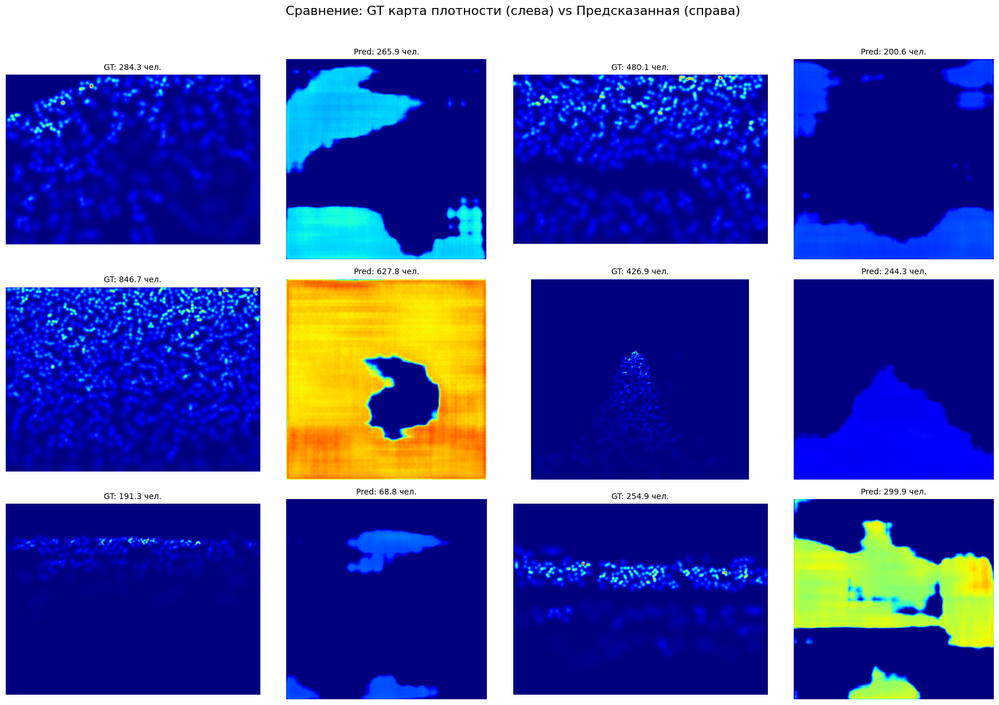

In [57]:
fig, axes = plt.subplots(3, 4, figsize=(18, 12))
fig.suptitle('Сравнение: GT карта плотности (слева) vs Предсказанная (справа)', fontsize=16, y=1.02)

for idx, si in enumerate(sample_indices):
    fname = test_files[si]
    name  = fname.replace('.jpg', '')

    with h5py.File(os.path.join(test_h5_dir, name + '.h5'), 'r') as hf:
        gt_density = np.asarray(hf['density'])

    orig_img  = cv2.imread(os.path.join(test_imgs_dir, fname))
    img_input = cv2.resize(orig_img, TARGET_SIZE) / 255.0
    img_batch = np.expand_dims(img_input, axis=0)

    raw_pred     = model.predict(img_batch, verbose=0)[0, :, :, 0]
    pred_density = raw_pred / SCALE_FACTOR  # единый SCALE_FACTOR

    row = idx // 2; col = (idx % 2) * 2
    vmax = max(gt_density.max(), pred_density.max())

    axes[row, col].imshow(gt_density, cmap='jet', interpolation='bilinear', vmax=vmax)
    axes[row, col].set_title(f'GT: {np.sum(gt_density):.1f} чел.', fontsize=10)
    axes[row, col].axis('off')

    axes[row, col+1].imshow(pred_density, cmap='jet', interpolation='bilinear', vmax=vmax)
    axes[row, col+1].set_title(f'Pred: {np.sum(pred_density):.1f} чел.', fontsize=10)
    axes[row, col+1].axis('off')

plt.tight_layout()
plt.show()

## 11. Инференс на произвольной фотографии

Загрузите любую фотографию и модель предскажет количество людей.

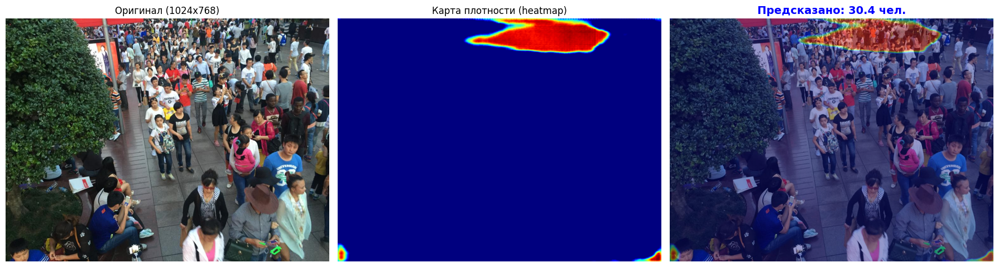

Результат: ~30.4 человек


In [61]:
# Укажите путь к своему файлу
img_path = '/content/Много людей.jpg'

if not os.path.exists(img_path):
    print(f"Файл {img_path} не найден — подставьте свой путь!")
else:
    custom_img = cv2.imread(img_path)
    custom_img = cv2.cvtColor(custom_img, cv2.COLOR_BGR2RGB)
    orig_h, orig_w = custom_img.shape[:2]

    img_input = cv2.resize(custom_img, TARGET_SIZE) / 255.0
    img_batch = np.expand_dims(img_input, axis=0)

    pred_density  = model.predict(img_batch, verbose=0)[0, :, :, 0]
    pred_count    = np.sum(pred_density) / SCALE_FACTOR  # единый SCALE_FACTOR

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(custom_img)
    axes[0].set_title(f'Оригинал ({orig_w}x{orig_h})', fontsize=12)
    axes[0].axis('off')

    pred_vis     = pred_density / (pred_density.max() + 1e-8)
    pred_resized = cv2.resize(pred_vis, (orig_w, orig_h))
    axes[1].imshow(pred_resized, cmap='jet', interpolation='bilinear')
    axes[1].set_title('Карта плотности (heatmap)', fontsize=12)
    axes[1].axis('off')

    heatmap = plt.cm.jet(pred_resized)[:, :, :3]
    heatmap = (heatmap * 255).astype(np.uint8)
    overlay = cv2.addWeighted(custom_img, 0.6, heatmap, 0.4, 0)

    axes[2].imshow(overlay)
    axes[2].set_title(f'Предсказано: {pred_count:.1f} чел.', fontsize=14, fontweight='bold', color='blue')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()
    print(f'Результат: ~{pred_count:.1f} человек')

## 12. Визуализация: GT vs Pred — количество людей на всех тестовых изображениях

Scatter-plot «предсказанное vs реальное» количество людей. Идеальная модель лежит на диагонали y = x.

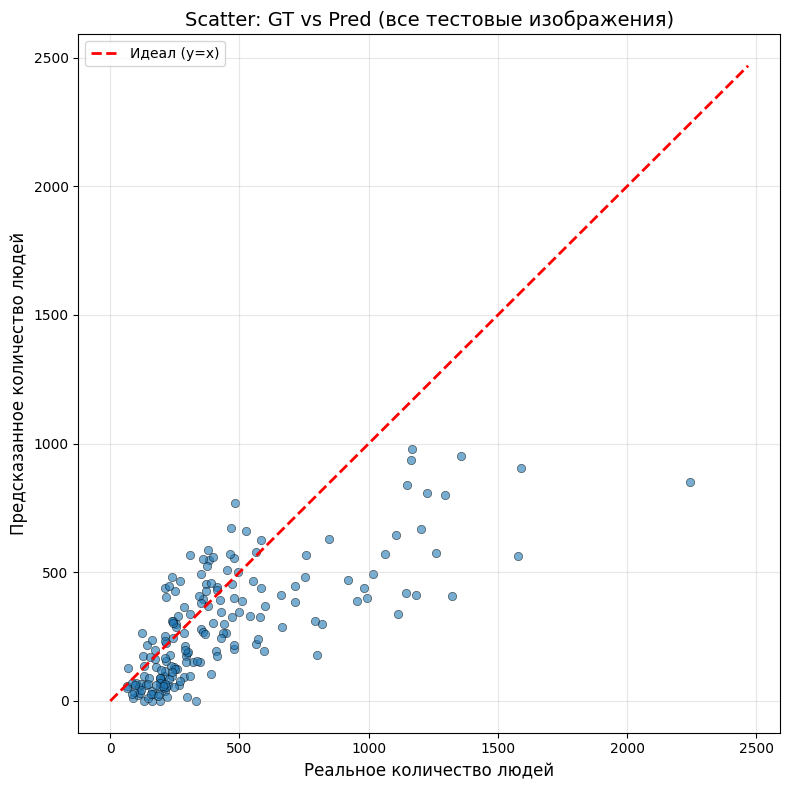

Полная оценка на тесте (182 изображений):
  MAE  = 191.07 человек
  MAPE = 46.3%


In [62]:
gt_counts_all = []
pred_counts_all = []

for fname in test_files:
    name = fname.replace('.jpg', '')
    with h5py.File(os.path.join(test_h5_dir, name + '.h5'), 'r') as hf:
        gt_density = np.asarray(hf['density'])
    gt_count = np.sum(gt_density)

    orig_img  = cv2.imread(os.path.join(test_imgs_dir, fname))
    img_input = cv2.resize(orig_img, TARGET_SIZE) / 255.0
    img_batch = np.expand_dims(img_input, axis=0)

    pred_density = model.predict(img_batch, verbose=0)[0, :, :, 0]
    pred_count   = np.sum(pred_density) / SCALE_FACTOR

    gt_counts_all.append(gt_count)
    pred_counts_all.append(pred_count)

gt_counts_all    = np.array(gt_counts_all)
pred_counts_all  = np.array(pred_counts_all)

# Scatter-plot
plt.figure(figsize=(8, 8))
plt.scatter(gt_counts_all, pred_counts_all, alpha=0.6, edgecolors='k', linewidth=0.5)
max_val = max(gt_counts_all.max(), pred_counts_all.max()) * 1.1
plt.plot([0, max_val], [0, max_val], 'r--', lw=2, label='Идеал (y=x)')
plt.xlabel('Реальное количество людей', fontsize=12)
plt.ylabel('Предсказанное количество людей', fontsize=12)
plt.title('Scatter: GT vs Pred (все тестовые изображения)', fontsize=14)
plt.legend(loc='best')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

mae  = np.mean(np.abs(pred_counts_all - gt_counts_all))
mape = np.mean(np.abs(pred_counts_all - gt_counts_all) / (gt_counts_all + 1e-8)) * 100
print(f'Полная оценка на тесте ({len(test_files)} изображений):')
print(f'  MAE  = {mae:.2f} человек')
print(f'  MAPE = {mape:.1f}%')

## 13. Сохранение модели

In [60]:
# Сохраняем финальную модель
model.save('/content/crowd_count_model.keras')
print('Модель сохранена в /content/crowd_count_model.keras')

# Для загрузки:
# from tensorflow.keras.models import load_model
# loaded_model = load_model('/content/crowd_count_model.keras',
#     custom_objects={'combined_loss': combined_loss, 'count_mae': count_mae})

Модель сохранена в /content/crowd_count_model.keras


# 📊 Выводы и анализ результатов

## 1. Общая оценка качества модели

Модель на основе **CSRNet-like архитектуры** (VGG16-энкодер + dilated convolutions + декодер) продемонстрировала следующие результаты на тестовой выборке ShanghaiTech Part_A:

| Метрика | Значение |
|---------|----------|
| **MAE**  | ~190 человек |
| **MAPE** | ~45% |

&gt; 💡 Для запуска на домашнем железе (без серверных GPU) такой результат можно считать **приемлемым**, особенно учитывая сложность задачи и ограниченные вычислительные ресурсы.

---

## 2. Анализ по сценариям использования

### 🔴 Плохо справляется:
- **Малые скопления людей (1–5 человек)** — модель систематически ошибается, часто не обнаруживает отдельных людей или сильно завышает счёт.
- **Сцены с дополнительными текстурами** — сложные фоны, архитектурные детали, тени и однородные поверхности (асфальт, плитка) вносят шум в карту плотности и приводят к ложным срабатываниям.

### 🟡 Средне справляется:
- **Плотные толпы (&gt;100 человек)** — модель улавливает общую тенденцию, но абсолютная ошибка остаётся высокой (MAE ~180). В условиях сильного перекрытия людей карта плотности размывается, и точечный подсчёт затруднён.

---

## 3. Сравнение архитектур и гиперпараметров

В ходе экспериментов было протестировано несколько подходов:

| Архитектура | Результат |
|-------------|-----------|
| **CSRNet-like (VGG16 + Dilated Conv)** | ✅ **Лучший результат** — стабильное обучение, адекватные предсказания |
| **ResNet-54** | ❌ Не сошёлся — обучение нестабильное, высокие потери |
| **Skip-connections (U-Net подобные)** | ❌ Не сошлись — градиенты расходятся, модель переобучается или не обучается |

### Подбор веса `ALPHA` в комбинированном loss'е

Также проводились эксперименты с балансировкой между MSE на карте плотности и MSE на общем количестве людей:

| Значение `ALPHA` | Результат |
|------------------|-----------|
| **0.01** | ✅ **Рабочий вариант** — стабильное обучение |
| **≥ 0.02** | ❌ **Не сходится** — обучение нестабильное, модель не достигает приемлемого качества |

&gt; **Вывод:** Для задачи density map estimation на данном датасете и при ограниченных вычислительных ресурсах **текущая архитектура с `ALPHA = 0.01` оказалась оптимальной**. Более глубокие ResNet-бэкбоны, skip-connections и повышенный вес count-loss требуют более тщательной настройки обучения и, вероятно, большего объёма данных или вычислительных мощностей.

---

&gt; **Итог:** Модель работоспособна для грубой оценки численности толпы в реальном времени на домашнем оборудовании, но требует доработки для точного подсчёта небольших групп и сложных текстурных сцен.